# Pump Sensor Data
Author: Wade Evans   
References:   
https://www.kaggle.com/nphantawee/pump-sensor-data   
https://towardsdatascience.com/anomaly-detection-in-time-series-sensor-data-86fd52e62538

This file contains 3 main groups of data:   
* Timestamp data
* Sensor data: All values are raw values
* Machine status: Target label to predict when the failure will happen

## Initial Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## Data

In [2]:
df = pd.read_csv('sensor.csv',index_col='timestamp',parse_dates=True)

In [3]:
# "T" = minutely frequency
df.index.freq = 'T'

In [4]:
df.index

DatetimeIndex(['2018-04-01 00:00:00', '2018-04-01 00:01:00',
               '2018-04-01 00:02:00', '2018-04-01 00:03:00',
               '2018-04-01 00:04:00', '2018-04-01 00:05:00',
               '2018-04-01 00:06:00', '2018-04-01 00:07:00',
               '2018-04-01 00:08:00', '2018-04-01 00:09:00',
               ...
               '2018-08-31 23:50:00', '2018-08-31 23:51:00',
               '2018-08-31 23:52:00', '2018-08-31 23:53:00',
               '2018-08-31 23:54:00', '2018-08-31 23:55:00',
               '2018-08-31 23:56:00', '2018-08-31 23:57:00',
               '2018-08-31 23:58:00', '2018-08-31 23:59:00'],
              dtype='datetime64[ns]', name='timestamp', length=220320, freq='T')

In [5]:
df.head()

,Unnamed: 0,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,0,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2018-04-01 00:01:00,1,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2018-04-01 00:02:00,2,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
2018-04-01 00:03:00,3,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
2018-04-01 00:04:00,4,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [6]:
df.describe()

,Unnamed: 0,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51
count,220320.000000,210112.000000,219951.000000,220301.000000,220301.000000,220301.000000,220301.000000,215522.000000,214869.000000,215213.000000,...,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,143303.000000,204937.000000
mean,110159.500000,2.372221,47.591611,50.867392,43.752481,590.673936,73.396414,13.501537,15.843152,15.200721,...,35.453455,43.879591,42.656877,43.094984,48.018585,44.340903,150.889044,57.119968,183.049260,202.699667
std,63601.049991,0.412227,3.296666,3.666820,2.418887,144.023912,17.298247,2.163736,2.201155,2.037390,...,10.259521,11.044404,11.576355,12.837520,15.641284,10.442437,82.244957,19.143598,65.258650,109.588607
min,0.000000,0.000000,0.000000,33.159720,31.640620,2.798032,0.000000,0.014468,0.000000,0.028935,...,22.135416,24.479166,25.752316,26.331018,26.331018,27.199070,26.331018,26.620370,27.488426,27.777779
25%,55079.750000,2.438831,46.310760,50.390620,42.838539,626.620400,69.976260,13.346350,15.907120,15.183740,...,32.812500,39.583330,36.747684,36.747684,40.509258,39.062500,83.912030,47.743060,167.534700,179.108800
50%,110159.500000,2.456539,48.133678,51.649300,44.227428,632.638916,75.576790,13.642940,16.167530,15.494790,...,35.156250,42.968750,40.509260,40.219910,44.849540,42.534720,138.020800,52.662040,193.865700,197.338000
75%,165239.250000,2.499826,49.479160,52.777770,45.312500,637.615723,80.912150,14.539930,16.427950,15.697340,...,36.979164,46.614580,45.138890,44.849540,51.215280,46.585650,208.333300,60.763890,219.907400,216.724500
max,220319.000000,2.549016,56.727430,56.032990,48.220490,800.000000,99.999880,22.251160,23.596640,24.348960,...,374.218800,408.593700,1000.000000,320.312500,370.370400,303.530100,561.632000,464.409700,1000.000000,1000.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 220320 entries, 2018-04-01 00:00:00 to 2018-08-31 23:59:00
Freq: T
Data columns (total 54 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      220320 non-null  int64  
 1   sensor_00       210112 non-null  float64
 2   sensor_01       219951 non-null  float64
 3   sensor_02       220301 non-null  float64
 4   sensor_03       220301 non-null  float64
 5   sensor_04       220301 non-null  float64
 6   sensor_05       220301 non-null  float64
 7   sensor_06       215522 non-null  float64
 8   sensor_07       214869 non-null  float64
 9   sensor_08       215213 non-null  float64
 10  sensor_09       215725 non-null  float64
 11  sensor_10       220301 non-null  float64
 12  sensor_11       220301 non-null  float64
 13  sensor_12       220301 non-null  float64
 14  sensor_13       220301 non-null  float64
 15  sensor_14       220299 non-null  float64
 16  sensor_15     

## Data Cleanup

In [8]:
# Check null values and sort in descending order
df.isnull().sum().sort_values(ascending=False)

sensor_15         220320
sensor_50          77017
sensor_51          15383
sensor_00          10208
sensor_07           5451
sensor_08           5107
sensor_06           4798
sensor_09           4595
sensor_01            369
sensor_30            261
sensor_29             72
sensor_32             68
sensor_17             46
sensor_18             46
sensor_22             41
sensor_25             36
sensor_16             31
sensor_43             27
sensor_42             27
sensor_49             27
sensor_48             27
sensor_47             27
sensor_46             27
sensor_38             27
sensor_39             27
sensor_45             27
sensor_40             27
sensor_41             27
sensor_44             27
sensor_14             21
sensor_26             20
sensor_11             19
sensor_02             19
sensor_03             19
sensor_04             19
sensor_05             19
sensor_13             19
sensor_12             19
sensor_10             19
sensor_31             16


In [9]:
len(df)

220320

In [10]:
# Percent null values
(df.isnull().sum().sort_values(ascending=False) / len(df)) *100

sensor_15         100.000000
sensor_50          34.956881
sensor_51           6.982117
sensor_00           4.633261
sensor_07           2.474129
sensor_08           2.317992
sensor_06           2.177741
sensor_09           2.085603
sensor_01           0.167484
sensor_30           0.118464
sensor_29           0.032680
sensor_32           0.030864
sensor_17           0.020879
sensor_18           0.020879
sensor_22           0.018609
sensor_25           0.016340
sensor_16           0.014070
sensor_43           0.012255
sensor_42           0.012255
sensor_49           0.012255
sensor_48           0.012255
sensor_47           0.012255
sensor_46           0.012255
sensor_38           0.012255
sensor_39           0.012255
sensor_45           0.012255
sensor_40           0.012255
sensor_41           0.012255
sensor_44           0.012255
sensor_14           0.009532
sensor_26           0.009078
sensor_11           0.008624
sensor_02           0.008624
sensor_03           0.008624
sensor_04     

In [11]:
# Drop columns with too many null values
df.drop(['Unnamed: 0','sensor_15','sensor_50'],axis=1,inplace=True)

### Impute using sklearn's SimpleImputer 

In [12]:
# To calculate mean, use imputer class
    # df.iloc[:, 0:-1] ---> columns to impute
    # Perhaps I should impute using median, rather than mean?
    
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
imputer.fit(df.iloc[:, 0:-1])
  
df.iloc[:, 0:-1] = imputer.transform(df.iloc[:, 0:-1])

In [13]:
df.isnull().sum()

sensor_00         0
sensor_01         0
sensor_02         0
sensor_03         0
sensor_04         0
sensor_05         0
sensor_06         0
sensor_07         0
sensor_08         0
sensor_09         0
sensor_10         0
sensor_11         0
sensor_12         0
sensor_13         0
sensor_14         0
sensor_16         0
sensor_17         0
sensor_18         0
sensor_19         0
sensor_20         0
sensor_21         0
sensor_22         0
sensor_23         0
sensor_24         0
sensor_25         0
sensor_26         0
sensor_27         0
sensor_28         0
sensor_29         0
sensor_30         0
sensor_31         0
sensor_32         0
sensor_33         0
sensor_34         0
sensor_35         0
sensor_36         0
sensor_37         0
sensor_38         0
sensor_39         0
sensor_40         0
sensor_41         0
sensor_42         0
sensor_43         0
sensor_44         0
sensor_45         0
sensor_46         0
sensor_47         0
sensor_48         0
sensor_49         0
sensor_51         0


In [14]:
df.head(3)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.31076,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.31076,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.39757,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL


## Exploratory Data Analysis

In [15]:
# Check unique target labels
df['machine_status'].unique()

array(['NORMAL', 'BROKEN', 'RECOVERING'], dtype=object)

### Sensor plots over time

**Individual sensor plot**

'sensor_00' with the 'BROKEN' state marked with red crosses

<AxesSubplot:xlabel='timestamp'>

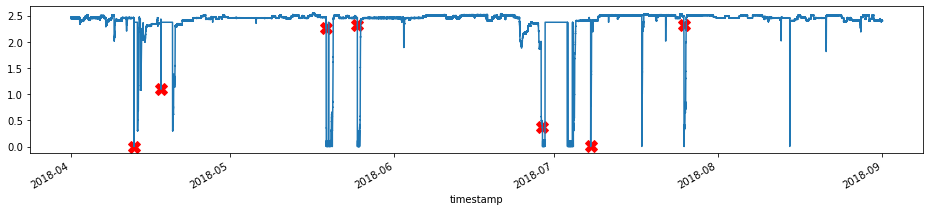

In [16]:
df['sensor_00'][df['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='red',markersize=12,figsize=(16,3))
df['sensor_00'].plot()

'sensor_01' with the 'BROKEN' state marked with red crosses

<AxesSubplot:xlabel='timestamp'>

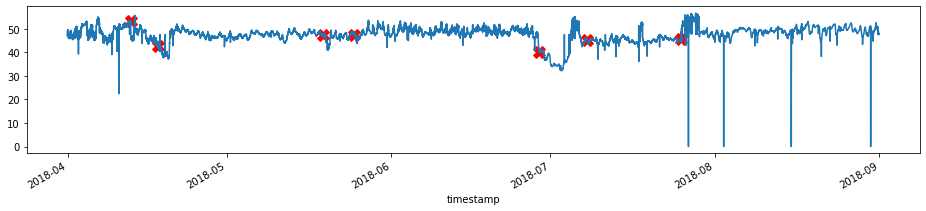

In [17]:
df['sensor_01'][df['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='red',markersize=12,figsize=(16,3))
df['sensor_01'].plot()

**Plot for all sensors**

In [18]:
col_names = df.iloc[:, 0:-1].columns

In [19]:
col_names

Index(['sensor_00', 'sensor_01', 'sensor_02', 'sensor_03', 'sensor_04',
       'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08', 'sensor_09',
       'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14',
       'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20',
       'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25',
       'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29', 'sensor_30',
       'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34', 'sensor_35',
       'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39', 'sensor_40',
       'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44', 'sensor_45',
       'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49', 'sensor_51'],
      dtype='object')

In [20]:
for name in col_names:
    print(name)

sensor_00
sensor_01
sensor_02
sensor_03
sensor_04
sensor_05
sensor_06
sensor_07
sensor_08
sensor_09
sensor_10
sensor_11
sensor_12
sensor_13
sensor_14
sensor_16
sensor_17
sensor_18
sensor_19
sensor_20
sensor_21
sensor_22
sensor_23
sensor_24
sensor_25
sensor_26
sensor_27
sensor_28
sensor_29
sensor_30
sensor_31
sensor_32
sensor_33
sensor_34
sensor_35
sensor_36
sensor_37
sensor_38
sensor_39
sensor_40
sensor_41
sensor_42
sensor_43
sensor_44
sensor_45
sensor_46
sensor_47
sensor_48
sensor_49
sensor_51


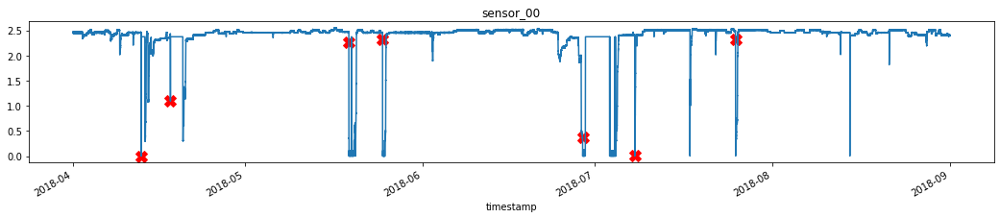

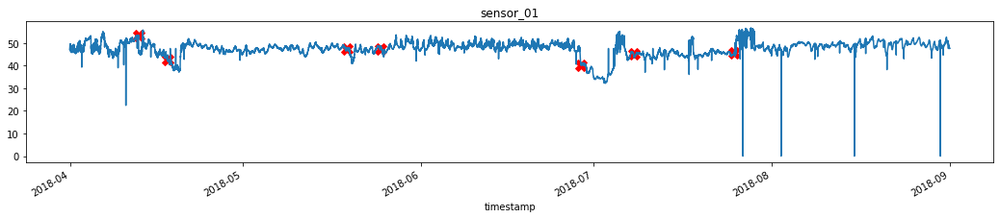

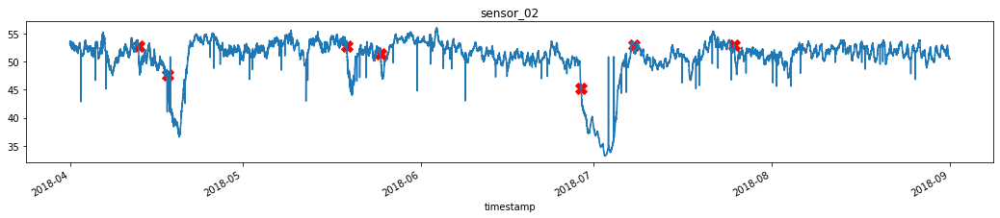

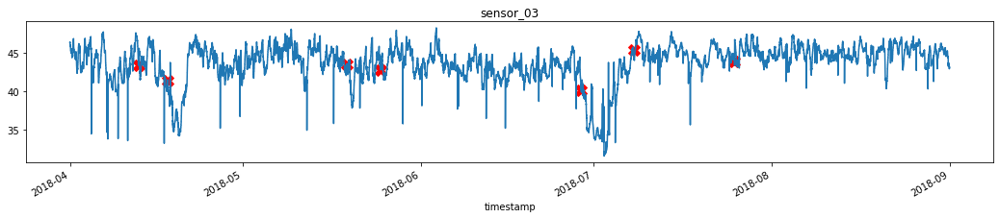

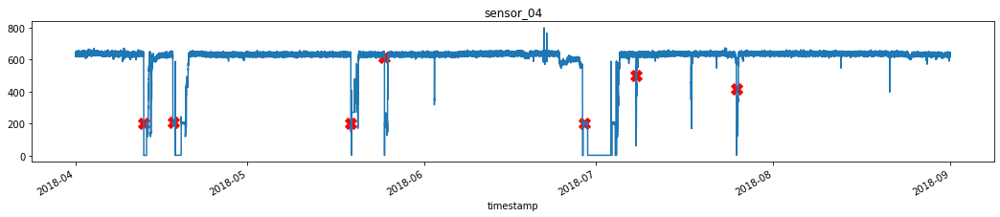

...

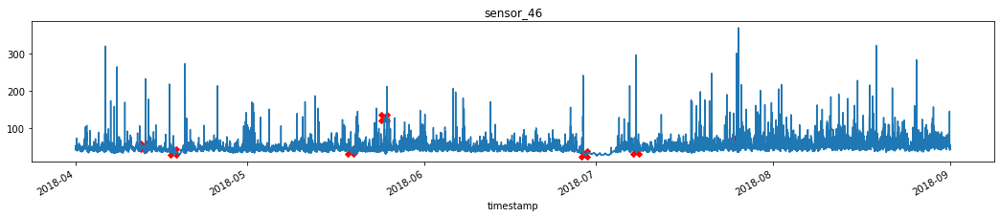

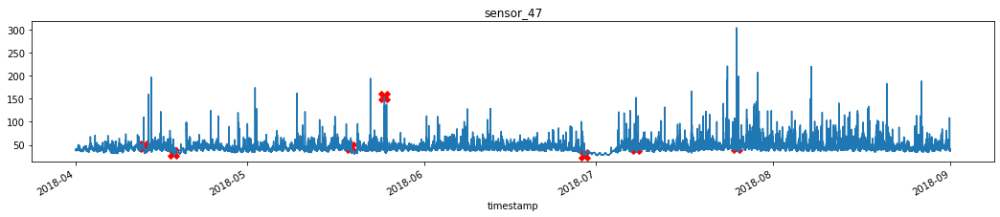

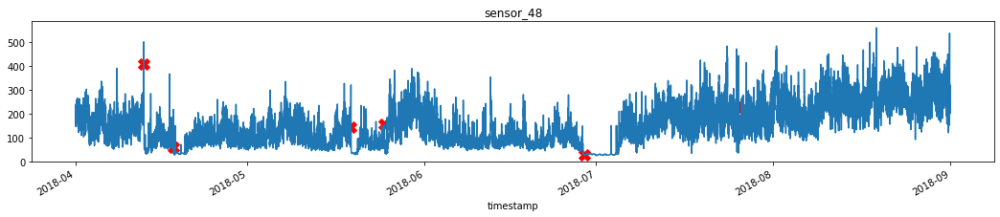

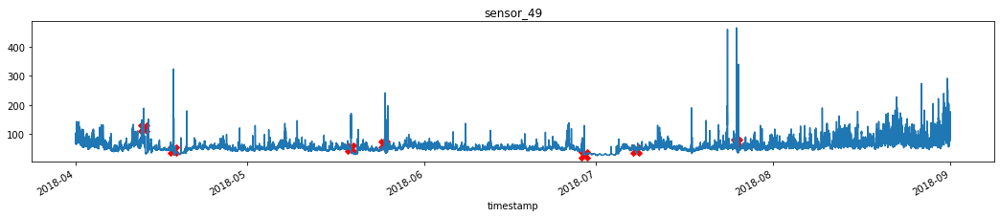

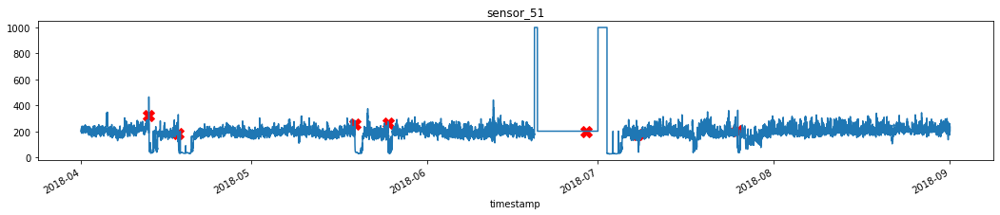

In [21]:
for name in col_names:
    df[name][df['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='red',markersize=12,figsize=(18,3))
    df[name].plot()
    plt.title(name)
    plt.show() # this line is required to get individual plots

## Principal Component Analysis

### Pipeline - Scale the data and apply PCA

In [22]:
df.drop(['machine_status'],axis=1)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,30.989580,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889
2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,30.989580,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889
2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,15.01013,...,30.468750,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037
2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,15.08247,...,30.468750,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250
2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,15.08247,...,30.989580,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,15.16204,...,30.468750,30.208330,38.28125,68.287030,52.37268,48.32176,41.087960,212.3843,153.64580,231.1921
2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,15.11863,...,30.208332,29.947920,38.28125,66.840280,50.63657,48.03241,40.798610,213.8310,156.25000,231.1921
2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,15.11863,...,29.947920,30.208330,39.06250,65.393520,48.90046,48.03241,40.798610,217.3032,155.38190,232.0602


In [23]:
df['machine_status']

timestamp
2018-04-01 00:00:00    NORMAL
2018-04-01 00:01:00    NORMAL
2018-04-01 00:02:00    NORMAL
2018-04-01 00:03:00    NORMAL
2018-04-01 00:04:00    NORMAL
                        ...  
2018-08-31 23:55:00    NORMAL
2018-08-31 23:56:00    NORMAL
2018-08-31 23:57:00    NORMAL
2018-08-31 23:58:00    NORMAL
2018-08-31 23:59:00    NORMAL
Freq: T, Name: machine_status, Length: 220320, dtype: object

**Train Test Split ???**

In [24]:
X = df.drop(['machine_status'],axis=1)
y = df['machine_status']

In [25]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA

In [26]:
scaler = StandardScaler()

In [27]:
pca = PCA()

In [28]:
pipeline = make_pipeline(scaler,pca)

In [29]:
pipeline

Pipeline(steps=[('standardscaler', StandardScaler()), ('pca', PCA())])

In [30]:
pipeline.fit(X)

Pipeline(steps=[('standardscaler', StandardScaler()), ('pca', PCA())])

**Plot the principal components against their inertia**

In [31]:
pca.n_components_

50

In [32]:
pca.explained_variance_

array([1.74760811e+01, 9.35278852e+00, 4.30259700e+00, 2.75207467e+00,
       2.12098797e+00, 1.61628484e+00, 1.29483881e+00, 1.10243303e+00,
       1.06907417e+00, 9.02055074e-01, 7.80599752e-01, 6.85673465e-01,
       6.02402659e-01, 4.92349001e-01, 4.37341528e-01, 4.04895722e-01,
       3.72344140e-01, 3.46337840e-01, 3.12195682e-01, 2.88996162e-01,
       2.65377832e-01, 2.58145594e-01, 2.48398144e-01, 2.35094212e-01,
       2.15167915e-01, 2.04694153e-01, 1.97537465e-01, 1.93307142e-01,
       1.84640868e-01, 1.76911402e-01, 1.51093520e-01, 1.30694477e-01,
       1.12175266e-01, 1.06123883e-01, 1.01395250e-01, 9.92387122e-02,
       8.72280215e-02, 7.08254350e-02, 5.18182186e-02, 4.60467011e-02,
       4.46623753e-02, 3.98921840e-02, 1.93426472e-02, 1.45559174e-02,
       9.59002836e-03, 8.91491155e-03, 6.45757571e-03, 5.61851273e-03,
       1.69723632e-03, 1.23022909e-03])

In [33]:
features = range(pca.n_components_)

In [34]:
features

range(0, 50)

In [35]:
for i in features:
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


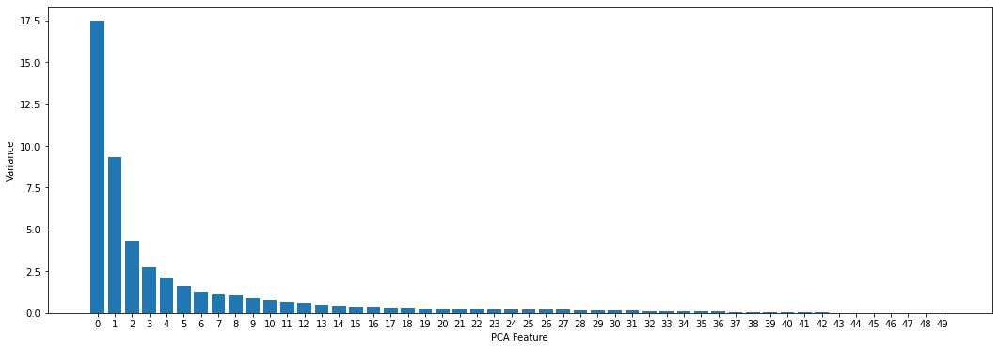

In [36]:
plt.figure(figsize=(18,6))
plt.bar(features,pca.explained_variance_)
plt.xticks(features)
plt.xlabel('PCA Feature')
plt.ylabel('Variance')
plt.show()

**Calculate PCA with 3 components**

In [37]:
pca = PCA(n_components=3)

In [38]:
principalComponents = pca.fit_transform(X)

In [39]:
principalDf = pd.DataFrame(data=principalComponents,columns=['pc1','pc2','pc3'])

In [40]:
principalDf

,pc1,pc2,pc3
0,69.523134,265.704571,-421.106227
1,69.523134,265.704571,-421.106227
2,27.841569,283.462197,-387.555955
3,24.548981,290.213914,-356.202964
4,29.627090,294.619639,-380.473571
...,...,...,...
220315,-308.531521,-274.597310,101.601243
220316,-294.603672,-256.328332,67.379373
220317,-300.207654,-256.932727,78.296242
220318,-285.141390,-263.099471,83.813394


## Check Stationarity of the Principal Components

**Function for running the augmented Dickey-Fuller Test - Test for Stationarity**

In [41]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

**Run the augmented Dickey-Fuller test**

In [42]:
adf_test(principalDf['pc1'])

Augmented Dickey-Fuller Test: 
ADF test statistic          -4.977101
p-value                      0.000025
# lags used                 82.000000
# observations          220237.000000
critical value (1%)         -3.430380
critical value (5%)         -2.861553
critical value (10%)        -2.566777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [43]:
adf_test(principalDf['pc2'])

Augmented Dickey-Fuller Test: 
ADF test statistic          -5.532128
p-value                      0.000002
# lags used                 83.000000
# observations          220236.000000
critical value (1%)         -3.430380
critical value (5%)         -2.861553
critical value (10%)        -2.566777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [44]:
adf_test(principalDf['pc3'])

Augmented Dickey-Fuller Test: 
ADF test statistic     -9.886110e+00
p-value                 3.660444e-17
# lags used             8.100000e+01
# observations          2.202380e+05
critical value (1%)    -3.430380e+00
critical value (5%)    -2.861553e+00
critical value (10%)   -2.566777e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


## Check Autocorrelation of the Principal Components

Autocorrelation is when a time series is linearly related to a lagged version of itself.   
By contrast, correlation is simply when two independent variables are linearly related.

### autocorr()

Pandas.Sereis.autocorr() function returns the value of the Pearson correlation coefficient. The Pearson correlation coefficient is a measure of the linear correlation between two variables. The Pearson correlation coefficient has a value between -1 and 1, where 0 is no linear correlation, >0 is a positive correlation, and <0 is a negative correlation. Positive correlation is when two variables change in tandem while a negative correlation coefficient means that the variables change inversely.

In [45]:
principalDf['pc1'].autocorr(lag=40)

0.9874630062698555

In [46]:
principalDf['pc2'].autocorr(lag=40)

0.9787581302480876

In [47]:
principalDf['pc3'].autocorr(lag=40)

0.9216078623114893

### Plot ACF

Confidence intervals are drawn as a cone. By default, this is set to a 95% confidence interval, suggesting that correlation values outside of this code are very likely a correlation and not a statistical fluke

In [48]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

Text(0, 0.5, 'Correlation')

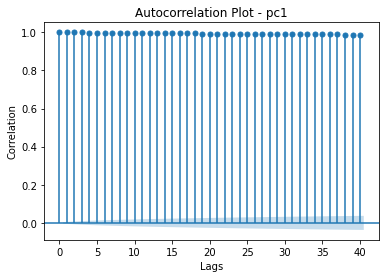

In [49]:
plot_acf(principalDf['pc1'],lags=40);
plt.title('Autocorrelation Plot - pc1')
plt.xlabel('Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

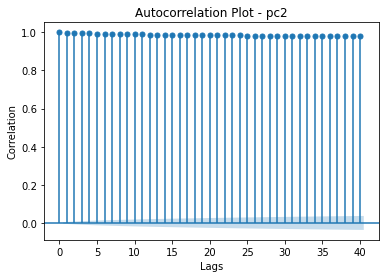

In [50]:
plot_acf(principalDf['pc2'],lags=40);
plt.title('Autocorrelation Plot - pc2')
plt.xlabel('Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

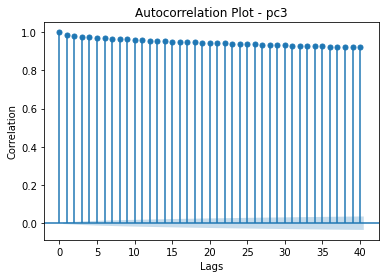

In [51]:
plot_acf(principalDf['pc3'],lags=40);
plt.title('Autocorrelation Plot - pc3')
plt.xlabel('Lags')
plt.ylabel('Correlation')

### Plot PACF

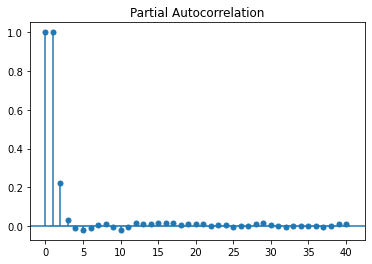

In [52]:
plot_pacf(principalDf['pc1'],lags=40);

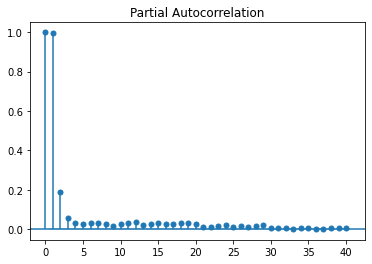

In [53]:
plot_pacf(principalDf['pc2'],lags=40);

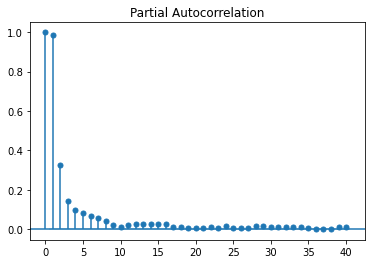

In [54]:
plot_pacf(principalDf['pc3'],lags=40);

# Modelling

## Interquartile Range

**Calculate IQR for pc1, upper and lower bounds for outlier for pc1, and filter out the outliers from pc1**

In [55]:
# IQR for pc1
q1_pc1, q3_pc1 = principalDf['pc1'].quantile([0.25,0.75])

In [56]:
q1_pc1

-379.34804453642334

In [57]:
q3_pc1

-138.70410790107516

In [58]:
iqr_pc1 = q3_pc1 - q1_pc1

In [59]:
iqr_pc1

240.64393663534818

In [60]:
# Upper and lower bounds for pc1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)

In [61]:
lower_pc1

-740.3139494894456

In [62]:
upper_pc1

222.26179705194713

In [63]:
# Filter out the outliers from pc1
principalDf['anomaly_pc1'] = ((principalDf['pc1']>upper_pc1) | (principalDf['pc1']<lower_pc1)).astype('int')

In [64]:
principalDf

,pc1,pc2,pc3,anomaly_pc1
0,69.523134,265.704571,-421.106227,0
1,69.523134,265.704571,-421.106227,0
2,27.841569,283.462197,-387.555955,0
3,24.548981,290.213914,-356.202964,0
4,29.627090,294.619639,-380.473571,0
...,...,...,...,...
220315,-308.531521,-274.597310,101.601243,0
220316,-294.603672,-256.328332,67.379373,0
220317,-300.207654,-256.932727,78.296242,0
220318,-285.141390,-263.099471,83.813394,0


In [65]:
principalDf['anomaly_pc1'].unique()

array([0, 1])

**Calculate IQR for pc2, upper and lower bounds for outlier for pc2, and filter out the outliers from pc2**

In [66]:
# IQR for pc2
q1_pc2, q3_pc2 = principalDf['pc2'].quantile([0.25,0.75])
iqr_pc2 = q3_pc2 - q1_pc2

In [67]:
# Upper and lower bounds for pc2
lower_pc2 = q1_pc2 - (1.5*iqr_pc2)
upper_pc2 = q3_pc2 + (1.5*iqr_pc2)

In [68]:
# Filter out the outliers from pc1
principalDf['anomaly_pc2'] = ((principalDf['pc2']>upper_pc2) | (principalDf['pc2']<lower_pc2)).astype('int')

**Calculate IQR for pc3, upper and lower bounds for outlier for pc3, and filter out the outliers from pc3**

In [69]:
# IQR for pc3
q1_pc3, q3_pc3 = principalDf['pc3'].quantile([0.25,0.75])
iqr_pc3 = q3_pc3 - q1_pc3

In [70]:
# Upper and lower bounds for pc3
lower_pc3 = q1_pc3 - (1.5*iqr_pc3)
upper_pc3 = q3_pc3 + (1.5*iqr_pc3)

In [71]:
# Filter out the outliers from pc1
principalDf['anomaly_pc3'] = ((principalDf['pc3']>upper_pc3) | (principalDf['pc3']<lower_pc3)).astype('int')

## Plot the Outliers

In [72]:
principalDf

,pc1,pc2,pc3,anomaly_pc1,anomaly_pc2,anomaly_pc3
0,69.523134,265.704571,-421.106227,0,0,1
1,69.523134,265.704571,-421.106227,0,0,1
2,27.841569,283.462197,-387.555955,0,0,1
3,24.548981,290.213914,-356.202964,0,0,1
4,29.627090,294.619639,-380.473571,0,0,1
...,...,...,...,...,...,...
220315,-308.531521,-274.597310,101.601243,0,0,0
220316,-294.603672,-256.328332,67.379373,0,0,0
220317,-300.207654,-256.932727,78.296242,0,0,0
220318,-285.141390,-263.099471,83.813394,0,0,0


In [73]:
df

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,15.01013,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL
2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,15.08247,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250,NORMAL
2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,15.08247,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889,NORMAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,15.16204,...,30.208330,38.28125,68.287030,52.37268,48.32176,41.087960,212.3843,153.64580,231.1921,NORMAL
2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,15.11863,...,29.947920,38.28125,66.840280,50.63657,48.03241,40.798610,213.8310,156.25000,231.1921,NORMAL
2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,15.11863,...,30.208330,39.06250,65.393520,48.90046,48.03241,40.798610,217.3032,155.38190,232.0602,NORMAL


In [74]:
df.reset_index(inplace=True)

In [75]:
df

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
0,2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
1,2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2,2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL
3,2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250,NORMAL
4,2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889,NORMAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220315,2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,...,30.208330,38.28125,68.287030,52.37268,48.32176,41.087960,212.3843,153.64580,231.1921,NORMAL
220316,2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,...,29.947920,38.28125,66.840280,50.63657,48.03241,40.798610,213.8310,156.25000,231.1921,NORMAL
220317,2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,...,30.208330,39.06250,65.393520,48.90046,48.03241,40.798610,217.3032,155.38190,232.0602,NORMAL
220318,2018-08-31 23:58:00,2.406366,47.69965,50.520832,43.142361,635.648100,65.09175,15.11863,16.56539,15.74074,...,30.208332,40.62500,64.236110,47.74306,48.32176,40.509258,222.5116,153.93520,234.0856,NORMAL


In [76]:
df1 = df.join(principalDf)

In [77]:
df1

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_48,sensor_49,sensor_51,machine_status,pc1,pc2,pc3,anomaly_pc1,anomaly_pc2,anomaly_pc3
0,2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1
1,2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1
2,2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,...,155.9606,67.12963,203.7037,NORMAL,27.841569,283.462197,-387.555955,0,0,1
3,2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,...,155.9606,66.84028,203.1250,NORMAL,24.548981,290.213914,-356.202964,0,0,1
4,2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,...,158.2755,66.55093,201.3889,NORMAL,29.627090,294.619639,-380.473571,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220315,2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,...,212.3843,153.64580,231.1921,NORMAL,-308.531521,-274.597310,101.601243,0,0,0
220316,2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,...,213.8310,156.25000,231.1921,NORMAL,-294.603672,-256.328332,67.379373,0,0,0
220317,2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,...,217.3032,155.38190,232.0602,NORMAL,-300.207654,-256.932727,78.296242,0,0,0
220318,2018-08-31 23:58:00,2.406366,47.69965,50.520832,43.142361,635.648100,65.09175,15.11863,16.56539,15.74074,...,222.5116,153.93520,234.0856,NORMAL,-285.141390,-263.099471,83.813394,0,0,0


In [78]:
df1.columns

Index(['timestamp', 'sensor_00', 'sensor_01', 'sensor_02', 'sensor_03',
       'sensor_04', 'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08',
       'sensor_09', 'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13',
       'sensor_14', 'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19',
       'sensor_20', 'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24',
       'sensor_25', 'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29',
       'sensor_30', 'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34',
       'sensor_35', 'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39',
       'sensor_40', 'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44',
       'sensor_45', 'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49',
       'sensor_51', 'machine_status', 'pc1', 'pc2', 'pc3', 'anomaly_pc1',
       'anomaly_pc2', 'anomaly_pc3'],
      dtype='object')

In [79]:
df1.set_index('timestamp',inplace=True)

In [80]:
df1.head(3)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_48,sensor_49,sensor_51,machine_status,pc1,pc2,pc3,anomaly_pc1,anomaly_pc2,anomaly_pc3
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.31076,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.31076,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.39757,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,155.9606,67.12963,203.7037,NORMAL,27.841569,283.462197,-387.555955,0,0,1


In [81]:
df1.index.freq = 'T'

In [82]:
df1.index

DatetimeIndex(['2018-04-01 00:00:00', '2018-04-01 00:01:00',
               '2018-04-01 00:02:00', '2018-04-01 00:03:00',
               '2018-04-01 00:04:00', '2018-04-01 00:05:00',
               '2018-04-01 00:06:00', '2018-04-01 00:07:00',
               '2018-04-01 00:08:00', '2018-04-01 00:09:00',
               ...
               '2018-08-31 23:50:00', '2018-08-31 23:51:00',
               '2018-08-31 23:52:00', '2018-08-31 23:53:00',
               '2018-08-31 23:54:00', '2018-08-31 23:55:00',
               '2018-08-31 23:56:00', '2018-08-31 23:57:00',
               '2018-08-31 23:58:00', '2018-08-31 23:59:00'],
              dtype='datetime64[ns]', name='timestamp', length=220320, freq='T')

In [83]:
df1['anomaly_pc1']

timestamp
2018-04-01 00:00:00    0
2018-04-01 00:01:00    0
2018-04-01 00:02:00    0
2018-04-01 00:03:00    0
2018-04-01 00:04:00    0
                      ..
2018-08-31 23:55:00    0
2018-08-31 23:56:00    0
2018-08-31 23:57:00    0
2018-08-31 23:58:00    0
2018-08-31 23:59:00    0
Freq: T, Name: anomaly_pc1, Length: 220320, dtype: int32

**Single plot of the outliers from pc1 on top of sensor_00**

Text(0.5, 1.0, 'sensor_00 anomalies')

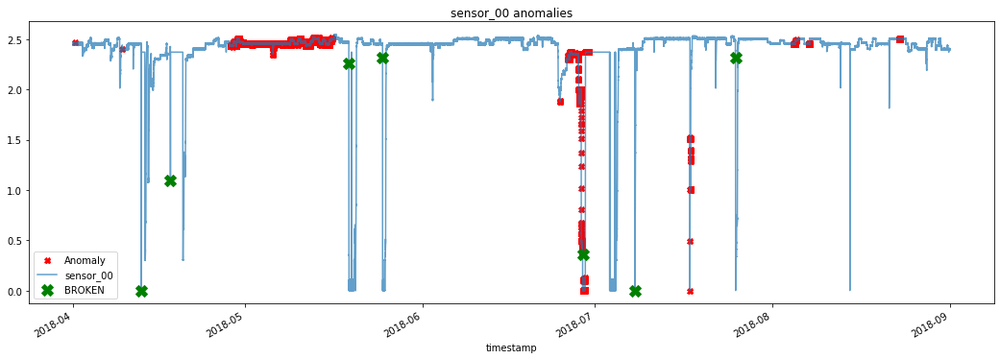

In [84]:
df1['sensor_00'][df1['anomaly_pc1']==1].plot(linestyle='none',marker='X',color='red',markersize=6,figsize=(18,6),label='Anomaly')
df1['sensor_00'].plot(alpha=0.7)
df1['sensor_00'][df1['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='green',markersize=12,label='BROKEN')
plt.legend()
plt.title('sensor_00 anomalies')

In [85]:
df1.iloc[:,54:]

,anomaly_pc1,anomaly_pc2,anomaly_pc3
timestamp,,,
2018-04-01 00:00:00,0,0,1
2018-04-01 00:01:00,0,0,1
2018-04-01 00:02:00,0,0,1
2018-04-01 00:03:00,0,0,1
2018-04-01 00:04:00,0,0,1
...,...,...,...
2018-08-31 23:55:00,0,0,0
2018-08-31 23:56:00,0,0,0
2018-08-31 23:57:00,0,0,0


**Plot of the outliers from pc1 to pc3, on top of sensor_00 to sensor51**   
(3 plots per sensor, where there are 50 sensors to plot for, therefore 150 plots (50 x 3)!)

In [86]:
col_names

Index(['sensor_00', 'sensor_01', 'sensor_02', 'sensor_03', 'sensor_04',
       'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08', 'sensor_09',
       'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14',
       'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20',
       'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25',
       'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29', 'sensor_30',
       'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34', 'sensor_35',
       'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39', 'sensor_40',
       'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44', 'sensor_45',
       'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49', 'sensor_51'],
      dtype='object')

In [87]:
col_names.nunique()

50

In [88]:
anomaly_col_names = df1.iloc[:,54:].columns

In [89]:
anomaly_col_names

Index(['anomaly_pc1', 'anomaly_pc2', 'anomaly_pc3'], dtype='object')

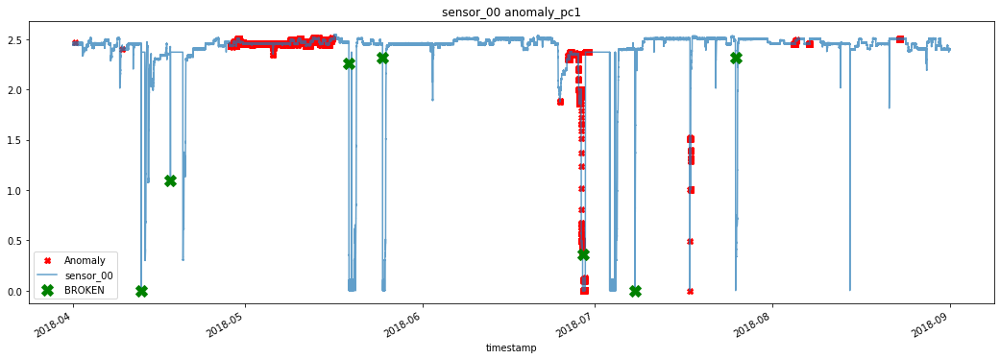

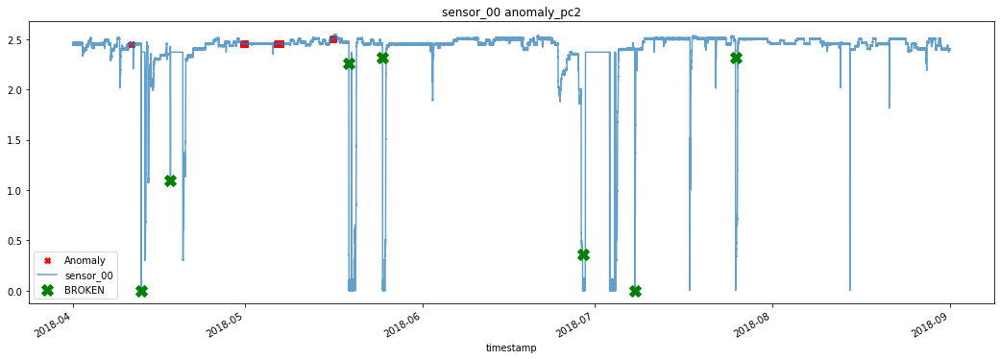

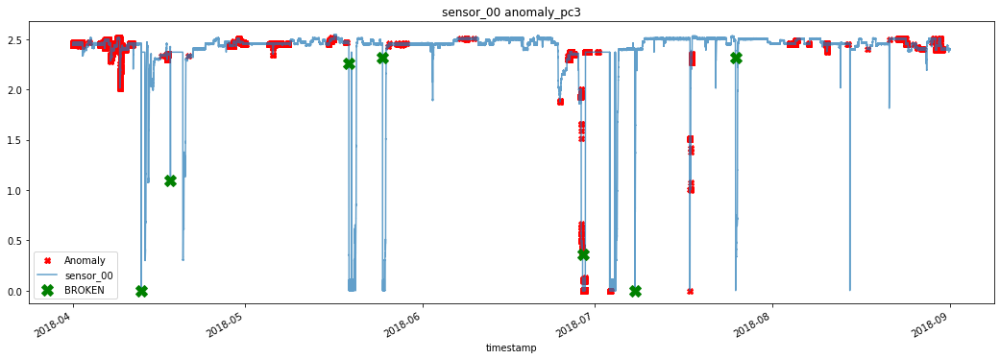

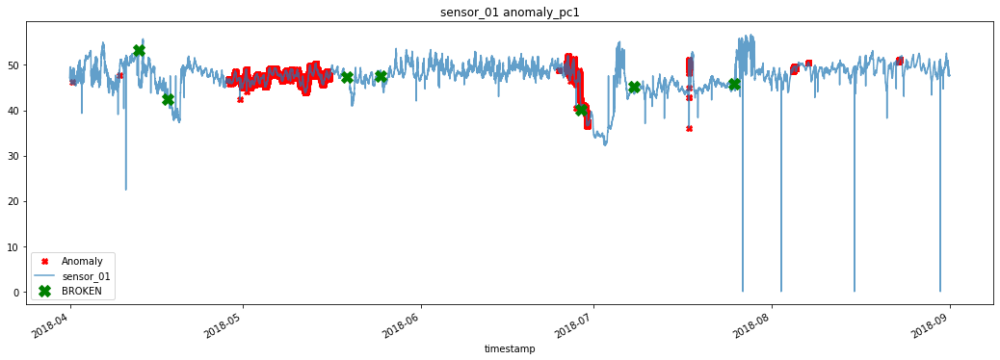

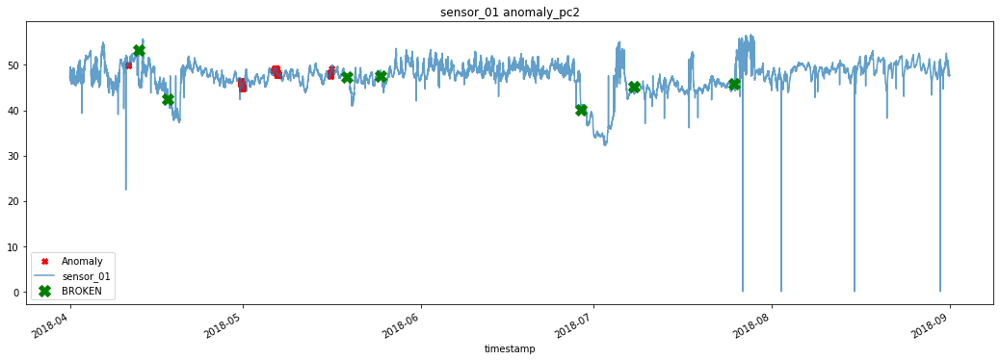

...

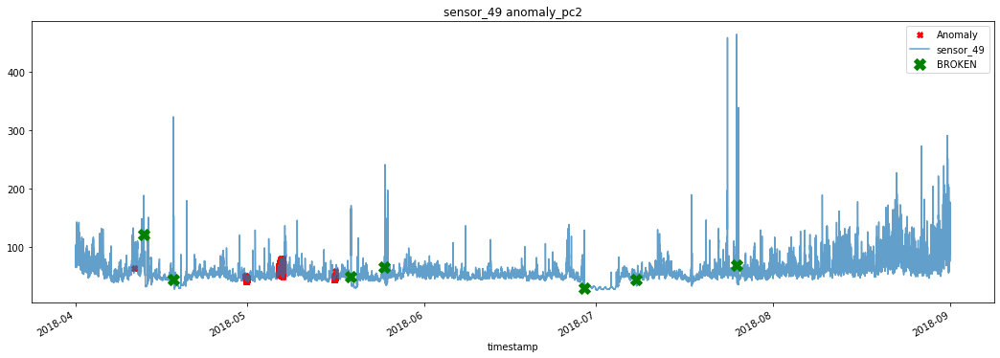

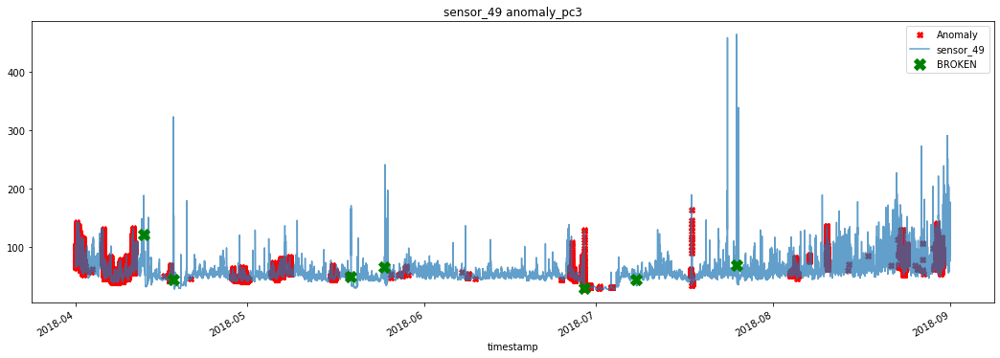

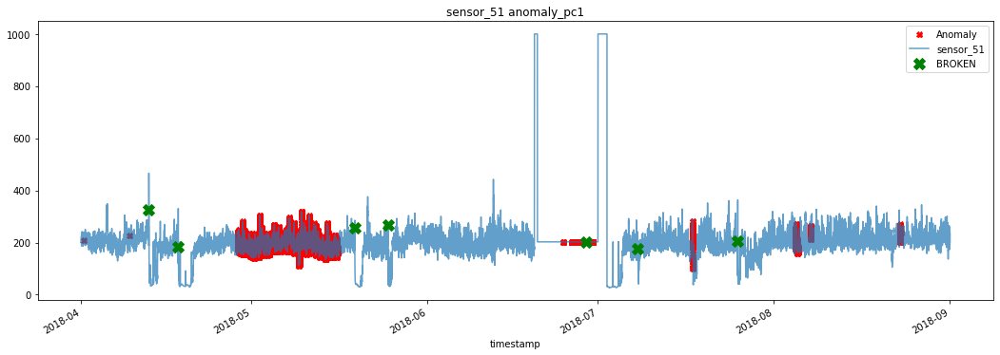

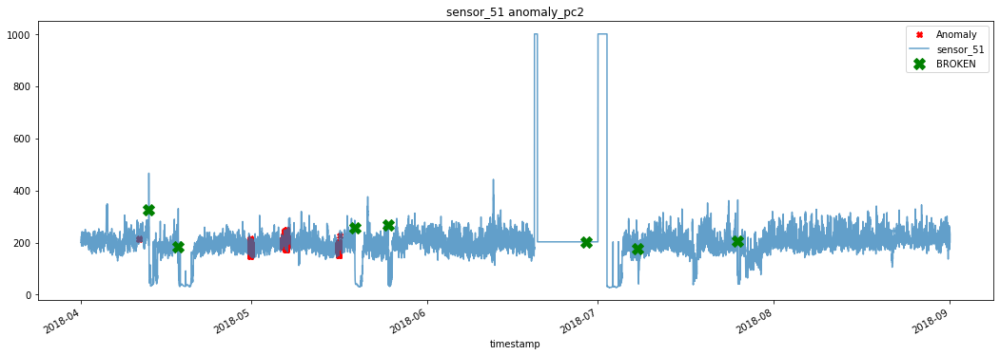

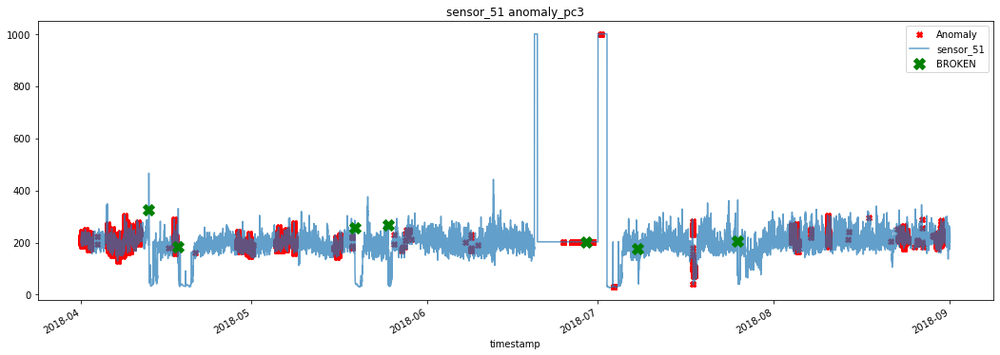

In [90]:
for sensor_name in col_names:
    for anomaly_name in anomaly_col_names:
        df1[sensor_name][df1[anomaly_name]==1].plot(linestyle='none',marker='X',color='red',markersize=6,figsize=(18,6),label='Anomaly')
        df1[sensor_name].plot(alpha=0.7)
        df1[sensor_name][df1['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='green',markersize=12,label='BROKEN')
        plt.legend()
        plt.title(sensor_name + ' ' + anomaly_name)
        plt.show()

**Here, I join all the anomaly columns into one column and then plot this column on top of each sensor**   
(1 plot per sensor, therefore 50 plots)

In [91]:
df1

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_48,sensor_49,sensor_51,machine_status,pc1,pc2,pc3,anomaly_pc1,anomaly_pc2,anomaly_pc3
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1
2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1
2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,15.01013,...,155.9606,67.12963,203.7037,NORMAL,27.841569,283.462197,-387.555955,0,0,1
2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,15.08247,...,155.9606,66.84028,203.1250,NORMAL,24.548981,290.213914,-356.202964,0,0,1
2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,15.08247,...,158.2755,66.55093,201.3889,NORMAL,29.627090,294.619639,-380.473571,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,15.16204,...,212.3843,153.64580,231.1921,NORMAL,-308.531521,-274.597310,101.601243,0,0,0
2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,15.11863,...,213.8310,156.25000,231.1921,NORMAL,-294.603672,-256.328332,67.379373,0,0,0
2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,15.11863,...,217.3032,155.38190,232.0602,NORMAL,-300.207654,-256.932727,78.296242,0,0,0


In [92]:
df1.iloc[:,54:]

,anomaly_pc1,anomaly_pc2,anomaly_pc3
timestamp,,,
2018-04-01 00:00:00,0,0,1
2018-04-01 00:01:00,0,0,1
2018-04-01 00:02:00,0,0,1
2018-04-01 00:03:00,0,0,1
2018-04-01 00:04:00,0,0,1
...,...,...,...
2018-08-31 23:55:00,0,0,0
2018-08-31 23:56:00,0,0,0
2018-08-31 23:57:00,0,0,0


In [93]:
df1['anomaly_pc'] = df1['anomaly_pc1'] + df1['anomaly_pc2'] + df1['anomaly_pc3']

In [94]:
df1

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_49,sensor_51,machine_status,pc1,pc2,pc3,anomaly_pc1,anomaly_pc2,anomaly_pc3,anomaly_pc
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1,1
2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,...,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,0,0,1,1
2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,15.01013,...,67.12963,203.7037,NORMAL,27.841569,283.462197,-387.555955,0,0,1,1
2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,15.08247,...,66.84028,203.1250,NORMAL,24.548981,290.213914,-356.202964,0,0,1,1
2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,15.08247,...,66.55093,201.3889,NORMAL,29.627090,294.619639,-380.473571,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,15.16204,...,153.64580,231.1921,NORMAL,-308.531521,-274.597310,101.601243,0,0,0,0
2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,15.11863,...,156.25000,231.1921,NORMAL,-294.603672,-256.328332,67.379373,0,0,0,0
2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,15.11863,...,155.38190,232.0602,NORMAL,-300.207654,-256.932727,78.296242,0,0,0,0


**Need to check above and below... Want 0 for normal, and 1 for anomaly, but we have 0,1,2,3.   
Possibly affects the plots below as well.**

In [95]:
df1['anomaly_pc'].unique()

array([1, 0, 2, 3], dtype=int32)

In [96]:
df1['anomaly_pc'].value_counts()

0    179005
1     34156
2      6360
3       799
Name: anomaly_pc, dtype: int64

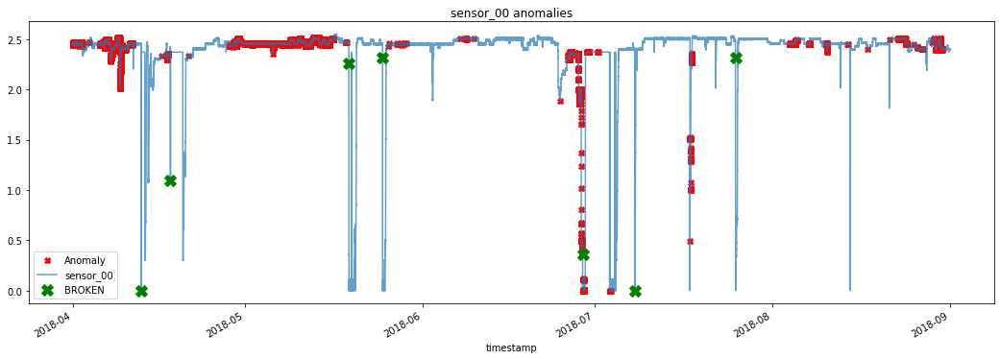

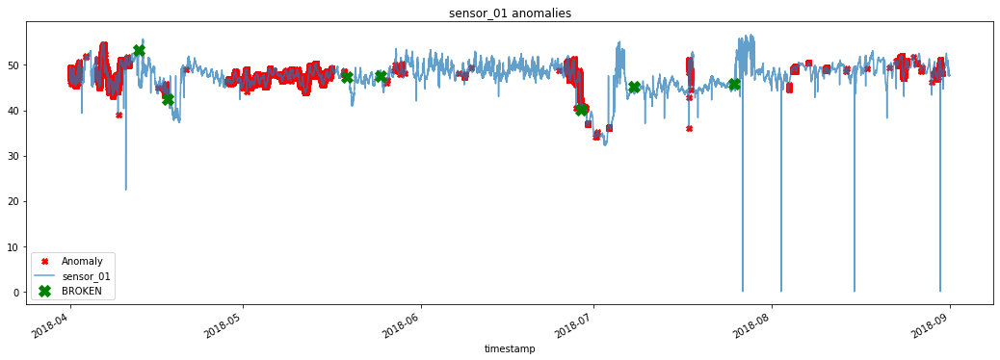

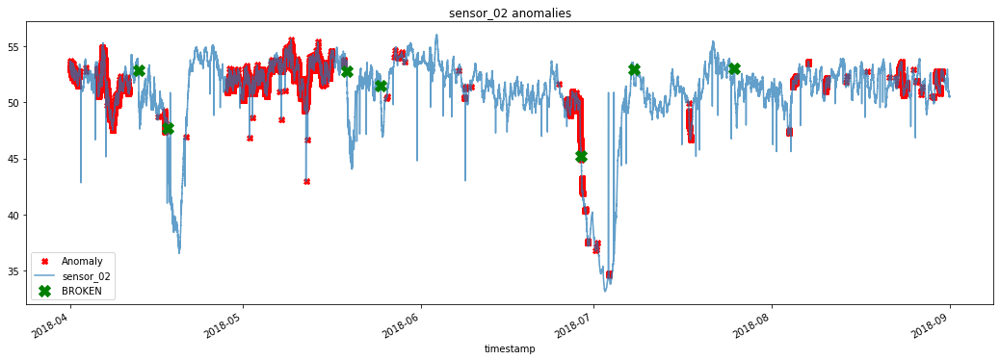

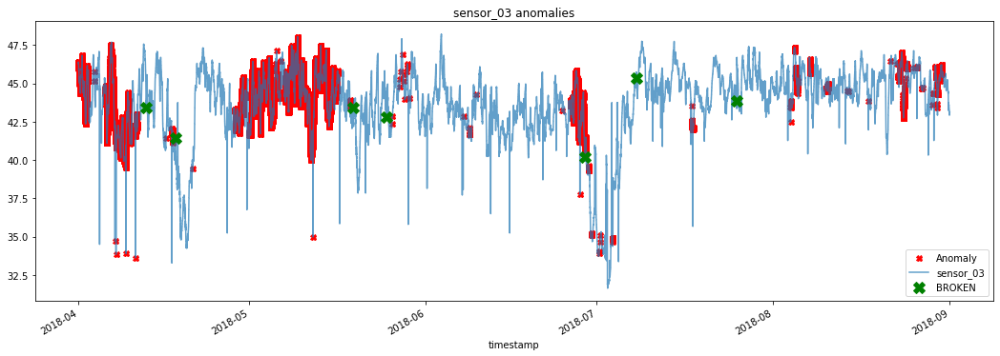

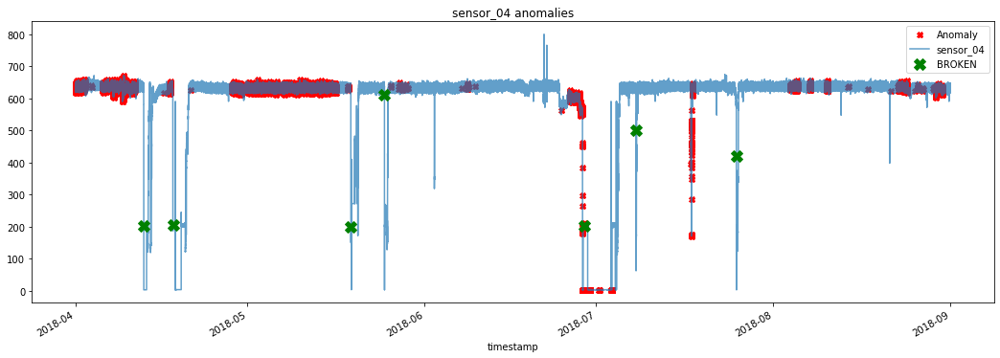

...

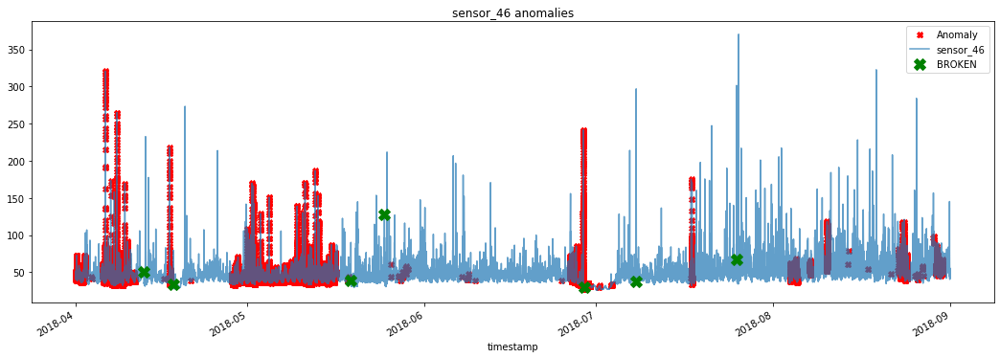

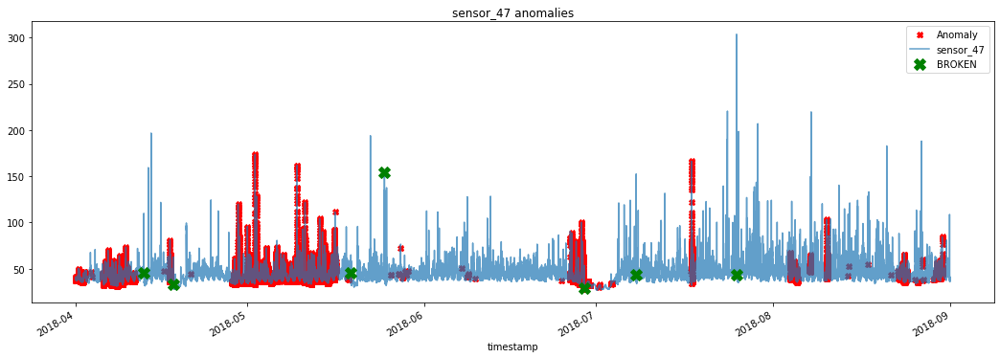

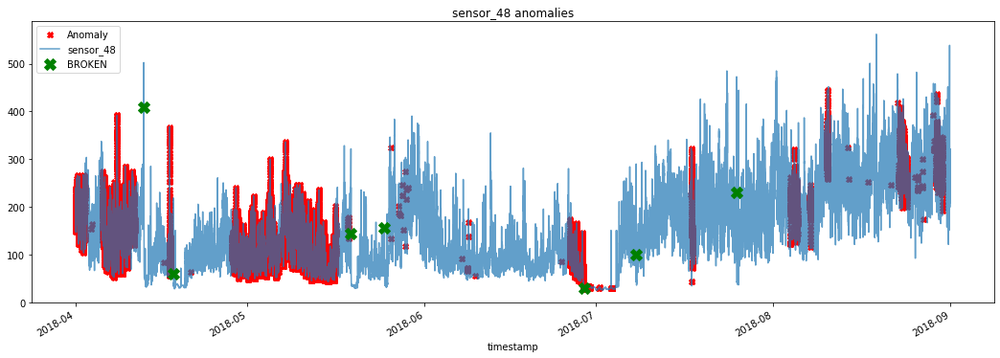

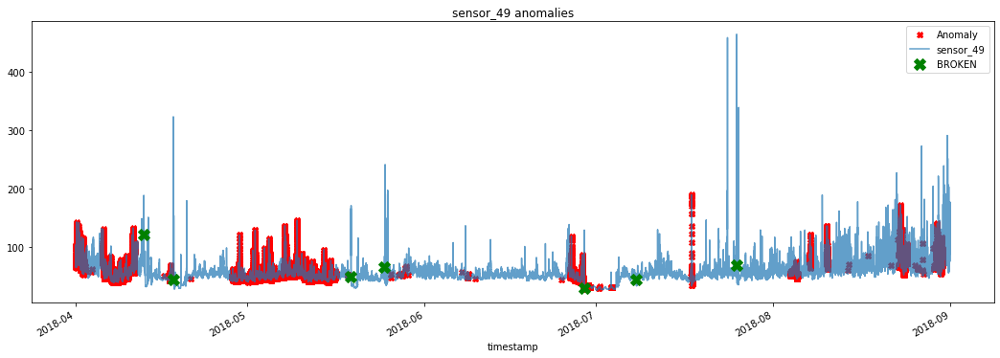

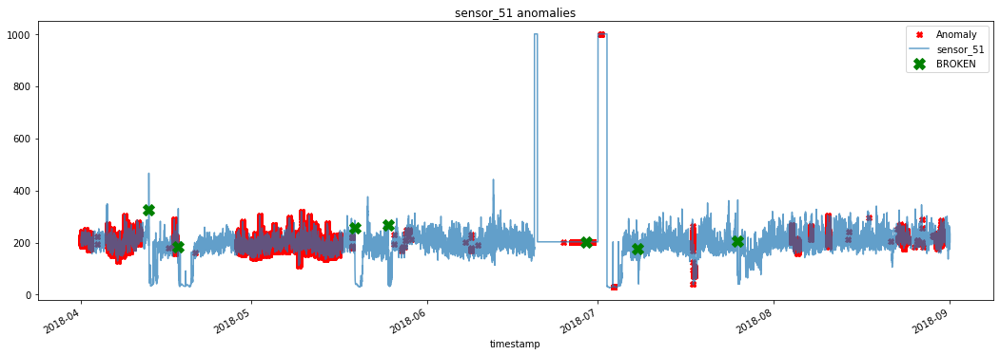

In [125]:
for sensor_name in col_names:
    df1[sensor_name][df1['anomaly_pc']==1].plot(linestyle='none',marker='X',color='red',markersize=6,figsize=(18,6),label='Anomaly')
    df1[sensor_name].plot(alpha=0.7)
    df1[sensor_name][df1['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='green',markersize=12,label='BROKEN')
    plt.legend()
    plt.title(sensor_name + ' anomalies')
    plt.show()

# Isolation Forest

In [98]:
principalDf = principalDf.drop(['anomaly_pc1','anomaly_pc2','anomaly_pc3'],axis=1)

In [99]:
principalDf.head()

,pc1,pc2,pc3
0,69.523134,265.704571,-421.106227
1,69.523134,265.704571,-421.106227
2,27.841569,283.462197,-387.555955
3,24.548981,290.213914,-356.202964
4,29.627090,294.619639,-380.473571


In [100]:
from sklearn.ensemble import IsolationForest

In [101]:
outliers_fraction = 0.13

In [102]:
isoforest_model = IsolationForest(contamination=outliers_fraction)

In [103]:
isoforest_model.fit(principalDf)

IsolationForest(contamination=0.13)

In [104]:
isoforest_predictions = isoforest_model.predict(principalDf)

In [105]:
isoforest_predictions

array([-1, -1, -1, ...,  1,  1,  1])

In [106]:
isoforest_predictions = pd.Series(isoforest_predictions)

In [107]:
isoforest_predictions

0        -1
1        -1
2        -1
3        -1
4        -1
         ..
220315    1
220316    1
220317    1
220318    1
220319    1
Length: 220320, dtype: int32

In [108]:
principalDf['isoforest_anomaly'] = isoforest_predictions

In [109]:
principalDf

,pc1,pc2,pc3,isoforest_anomaly
0,69.523134,265.704571,-421.106227,-1
1,69.523134,265.704571,-421.106227,-1
2,27.841569,283.462197,-387.555955,-1
3,24.548981,290.213914,-356.202964,-1
4,29.627090,294.619639,-380.473571,-1
...,...,...,...,...
220315,-308.531521,-274.597310,101.601243,1
220316,-294.603672,-256.328332,67.379373,1
220317,-300.207654,-256.932727,78.296242,1
220318,-285.141390,-263.099471,83.813394,1


In [110]:
principalDf['isoforest_anomaly'].unique()

array([-1,  1])

In [111]:
principalDf['isoforest_anomaly'].value_counts()

 1    191678
-1     28642
Name: isoforest_anomaly, dtype: int64

In [112]:
df

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
0,2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
1,2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2,2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL
3,2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250,NORMAL
4,2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889,NORMAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220315,2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,...,30.208330,38.28125,68.287030,52.37268,48.32176,41.087960,212.3843,153.64580,231.1921,NORMAL
220316,2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,...,29.947920,38.28125,66.840280,50.63657,48.03241,40.798610,213.8310,156.25000,231.1921,NORMAL
220317,2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,...,30.208330,39.06250,65.393520,48.90046,48.03241,40.798610,217.3032,155.38190,232.0602,NORMAL
220318,2018-08-31 23:58:00,2.406366,47.69965,50.520832,43.142361,635.648100,65.09175,15.11863,16.56539,15.74074,...,30.208332,40.62500,64.236110,47.74306,48.32176,40.509258,222.5116,153.93520,234.0856,NORMAL


In [113]:
df2 = df.join(principalDf)

In [114]:
df2

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status,pc1,pc2,pc3,isoforest_anomaly
0,2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,-1
1,2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,...,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL,69.523134,265.704571,-421.106227,-1
2,2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,...,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL,27.841569,283.462197,-387.555955,-1
3,2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,...,51.21528,38.194440,155.9606,66.84028,203.1250,NORMAL,24.548981,290.213914,-356.202964,-1
4,2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,...,51.79398,38.773150,158.2755,66.55093,201.3889,NORMAL,29.627090,294.619639,-380.473571,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220315,2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,...,48.32176,41.087960,212.3843,153.64580,231.1921,NORMAL,-308.531521,-274.597310,101.601243,1
220316,2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,...,48.03241,40.798610,213.8310,156.25000,231.1921,NORMAL,-294.603672,-256.328332,67.379373,1
220317,2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,...,48.03241,40.798610,217.3032,155.38190,232.0602,NORMAL,-300.207654,-256.932727,78.296242,1
220318,2018-08-31 23:58:00,2.406366,47.69965,50.520832,43.142361,635.648100,65.09175,15.11863,16.56539,15.74074,...,48.32176,40.509258,222.5116,153.93520,234.0856,NORMAL,-285.141390,-263.099471,83.813394,1


Text(0.5, 1.0, 'sensor_00 anomalies')

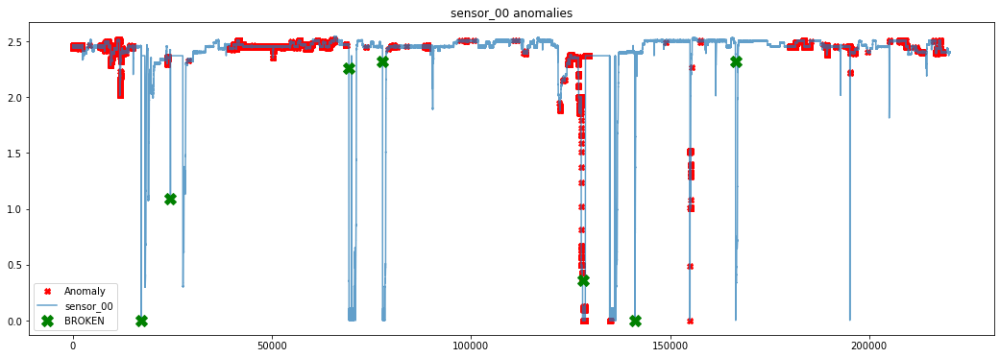

In [115]:
df2['sensor_00'][df2['isoforest_anomaly']==-1].plot(linestyle='none',marker='X',color='red',markersize=6,figsize=(18,6),label='Anomaly')
df2['sensor_00'].plot(alpha=0.7)
df2['sensor_00'][df2['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='green',markersize=12,label='BROKEN')
plt.legend()
plt.title('sensor_00 anomalies')

In [116]:
col_names

Index(['sensor_00', 'sensor_01', 'sensor_02', 'sensor_03', 'sensor_04',
       'sensor_05', 'sensor_06', 'sensor_07', 'sensor_08', 'sensor_09',
       'sensor_10', 'sensor_11', 'sensor_12', 'sensor_13', 'sensor_14',
       'sensor_16', 'sensor_17', 'sensor_18', 'sensor_19', 'sensor_20',
       'sensor_21', 'sensor_22', 'sensor_23', 'sensor_24', 'sensor_25',
       'sensor_26', 'sensor_27', 'sensor_28', 'sensor_29', 'sensor_30',
       'sensor_31', 'sensor_32', 'sensor_33', 'sensor_34', 'sensor_35',
       'sensor_36', 'sensor_37', 'sensor_38', 'sensor_39', 'sensor_40',
       'sensor_41', 'sensor_42', 'sensor_43', 'sensor_44', 'sensor_45',
       'sensor_46', 'sensor_47', 'sensor_48', 'sensor_49', 'sensor_51'],
      dtype='object')

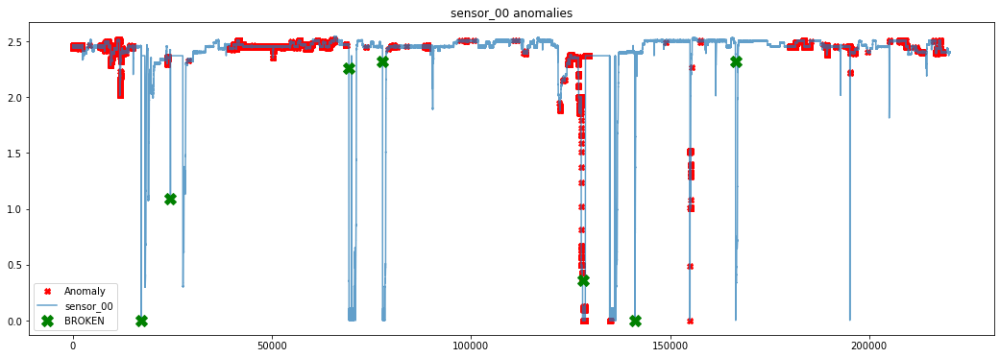

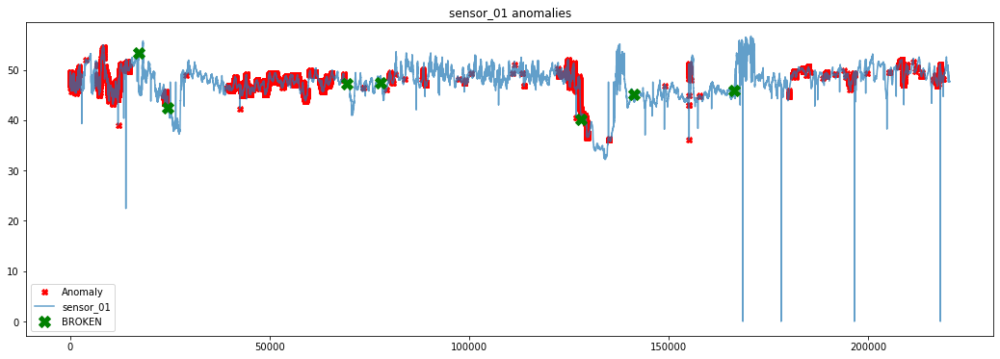

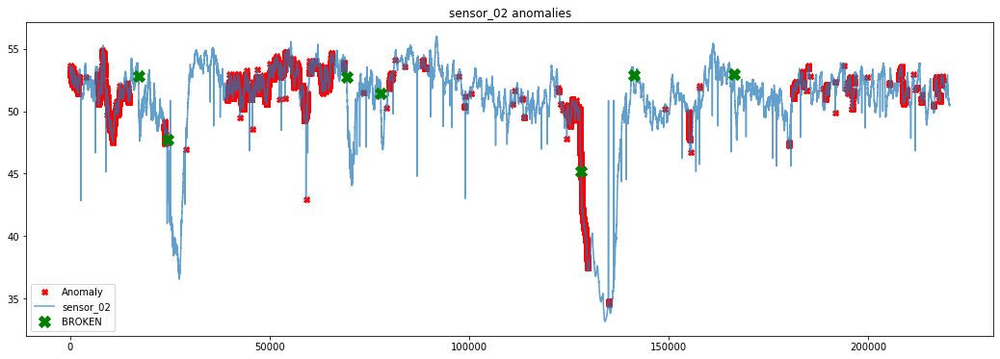

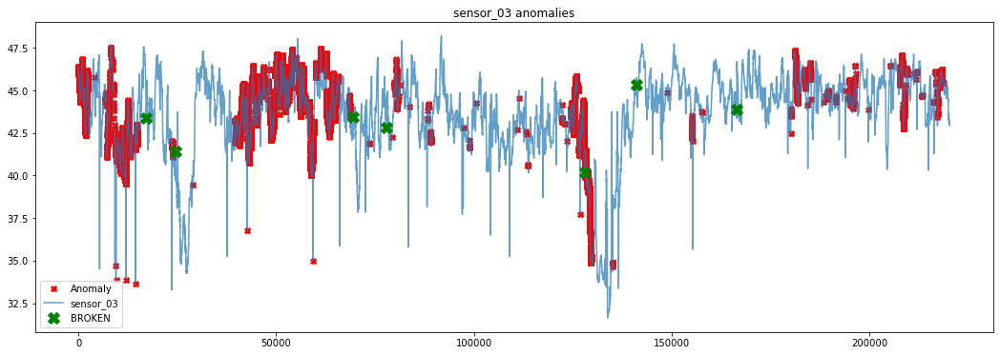

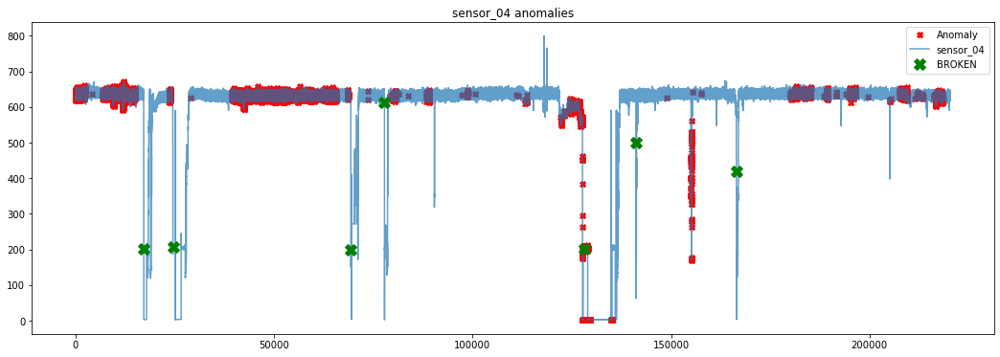

...

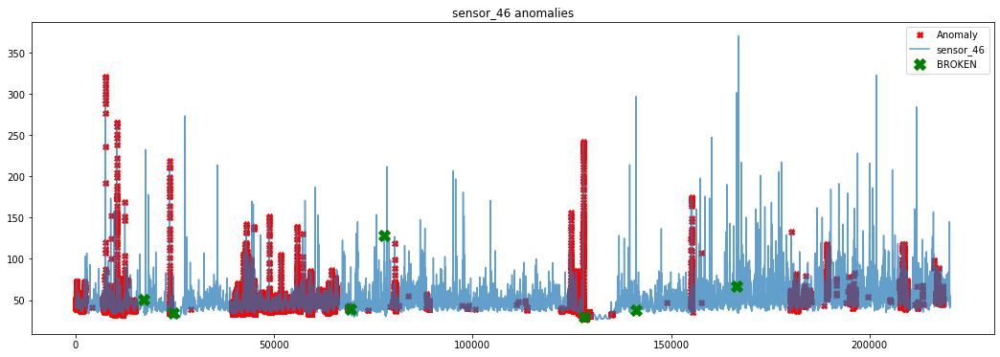

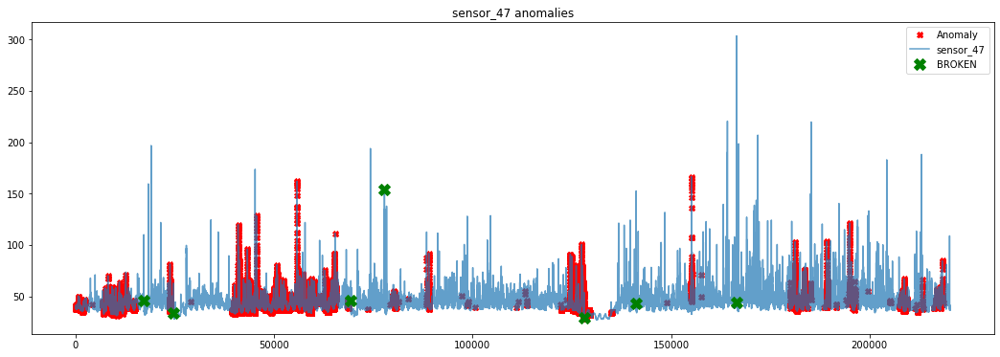

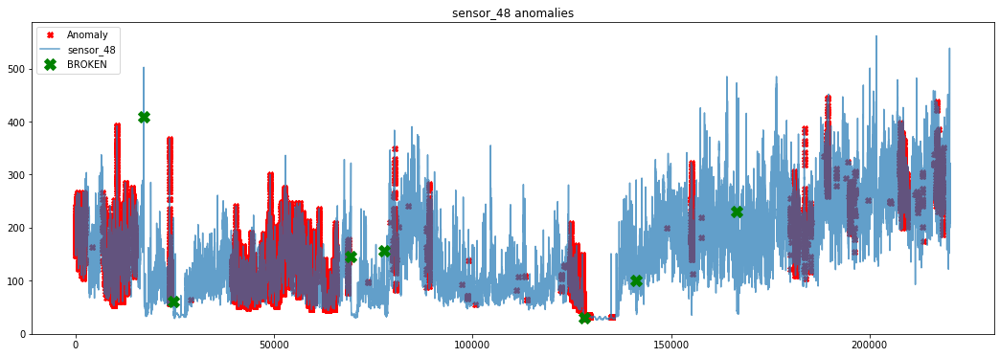

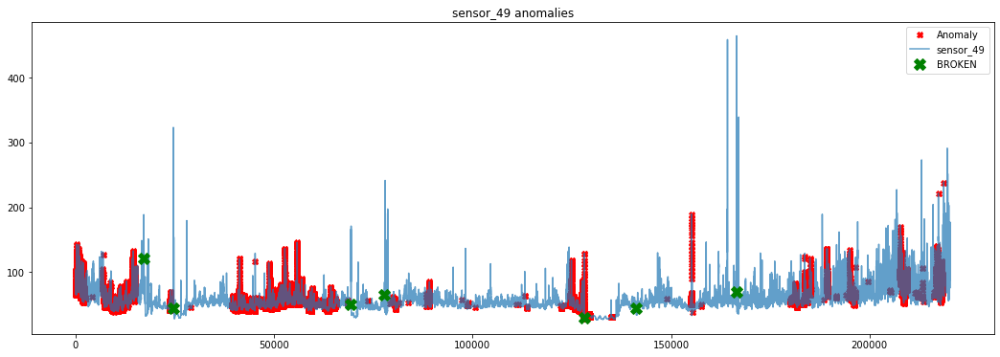

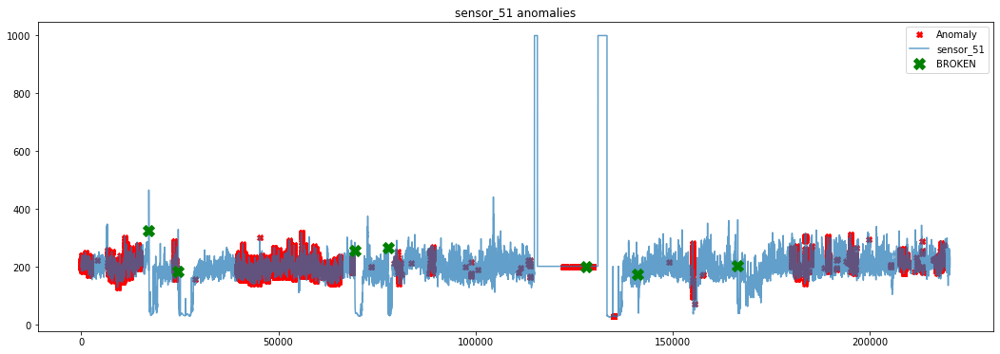

In [117]:
for sensor_name in col_names:
    df2[sensor_name][df2['isoforest_anomaly']==-1].plot(linestyle='none',marker='X',color='red',markersize=6,figsize=(18,6),label='Anomaly')
    df2[sensor_name].plot(alpha=0.7)
    df2[sensor_name][df2['machine_status']=='BROKEN'].plot(linestyle='none',marker='X',color='green',markersize=12,label='BROKEN')
    plt.legend()
    plt.title(sensor_name + ' anomalies')
    plt.show()

# K-Means Clustering

In [118]:
#from sklearn.cluster import KMeans

In [119]:
#kmeans = KMeans(n_clusters=2)

In [120]:
#kmeans.fit(principalDf)

In [121]:
#kmeans.cluster_centers_

In [122]:
#kmeans.labels_

In [123]:
#np.unique(kmeans.labels_)